## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

# 1. Calibrating the camera

**Read all the calibration images**

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

# Read all the clibration images
image_fnames = glob.glob('camera_cal/calibration*.jpg')
images = []


**Find the chessboard corners and draw them**

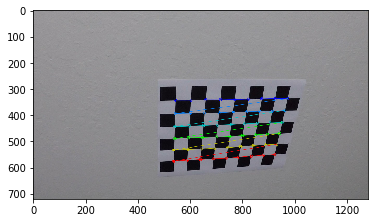

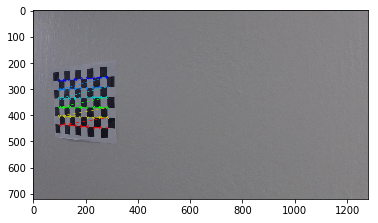

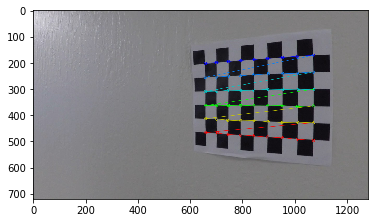

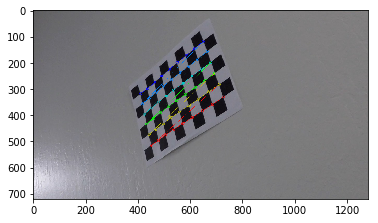

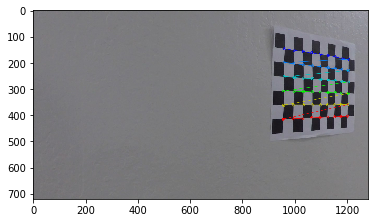

...

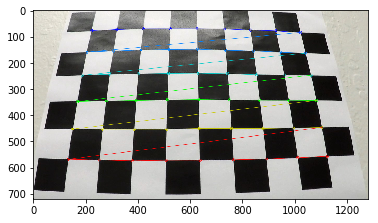

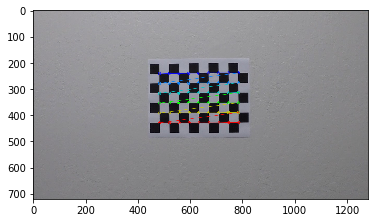

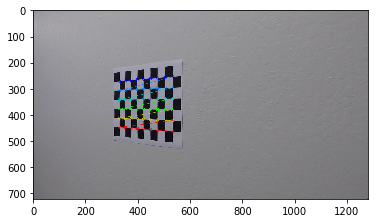

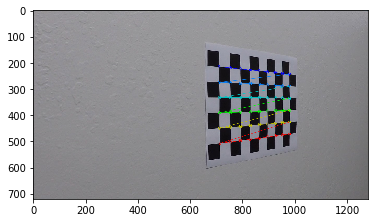

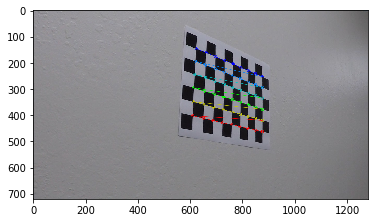

In [2]:
# Arrays to store object points and image points from all the images

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image space

# initialize the object points as (0,0,0), (1,0,0), ..., (8,5,0)
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x, y coordinates

for fname in image_fnames:
    # read in each image
    img = mpimg.imread(fname)
    images.append(img)
    
    # convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    # if corners are found, append object points, image points 
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        #draw and display the corners
        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.figure()
        plt.imshow(img)


**Calibrate the camera using `cv2.calibrateCamera`**

In [3]:
# perform the calibration
shape = images[0].shape[:2]
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, shape, None, None)


** Verify that the calibration works**

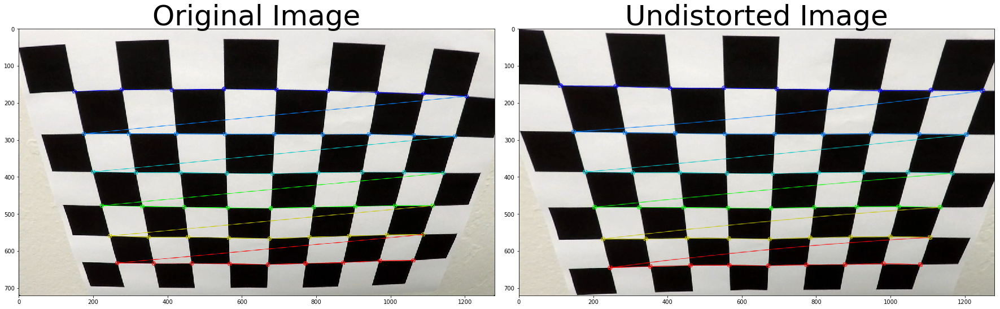

In [4]:
# pick a calibration image and undistort it to check
undistorted = cv2.undistort(images[11], mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(images[11])
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# 2. Undistort the test images

In [5]:
def undistort(image):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    return undistorted

In [6]:
import glob
files = glob.glob('test_images/*.jpg')
original_images = []
undistorted_images = []

for file in files:
    image = mpimg.imread(file)
    original_images.append(image)
    image_undistorted = undistort(image)
    undistorted_images.append(image_undistorted)


**Compare the original image and undistored image**

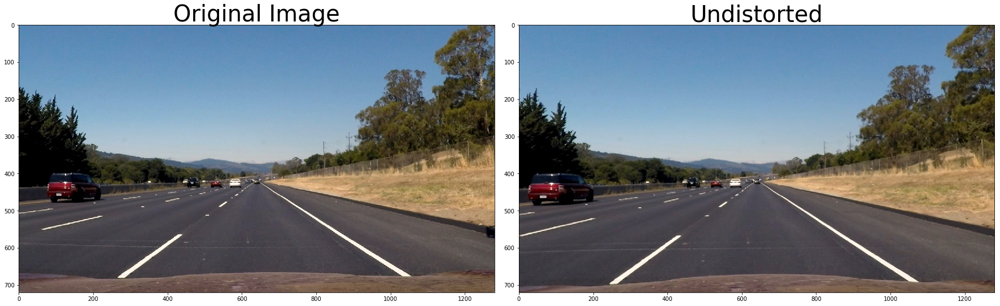

In [7]:

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(original_images[1])
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(undistorted_images[1])
ax2.set_title('Undistorted', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# 3. Thresholding
**Define the pipeline**

In [8]:
def color_thresh(image, thresh=(0,255)):
    R = image[:,:,0]
    G = image[:,:,1]
    B = image[:,:,2]
    binary = np.zeros_like(R)
    binary[(R >= thresh[0]) & (G >= thresh[0]) & (R <= thresh[1]) & (G <= thresh[1])] = 1
    return binary

def hsv_thresh(image, thresh=(160, 255)):
    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV).astype(np.float)
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]
    
    binary = np.zeros_like(v_channel)
    binary[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary

def hls_thresh(image, thresh=(50, 200)):
    # Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]    
    
    binary = np.zeros_like(s_channel)
    binary[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1

    return binary

def luv_thresh(image, thresh=(100,150)):
    # Convert to LUV color space
    luv = cv2.cvtColor(image, cv2.COLOR_RGB2Luv).astype(np.float)
    l_channel = luv[:,:,0]
    
    binary = np.zeros_like(l_channel)
    binary[(l_channel >= thresh[0]) & (l_channel <= thresh[1])] = 1
    return binary

def lab_thresh(image, thresh=(200, 255)):
    # Convert to LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2Lab).astype(np.float)
    b_channel = lab[:,:,2]
    
    binary = np.zeros_like(b_channel)
    binary[(b_channel >= thresh[0]) & (b_channel <= thresh[1])] = 1
    return binary

def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY).astype(np.float)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY).astype(np.float)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude
    sobelmag = np.sqrt(np.power(sobelx,2) + np.power(sobely,2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*sobelmag/np.max(sobelmag))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output
                     
def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY).astype(np.float)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    sobelx_abs = np.absolute(sobelx)
    sobely_abs = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(sobely_abs, sobelx_abs)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def sobel_thresh(image):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ksize = 3
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(30, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

    
# Edit this function to create your own pipeline.
def pipeline(image):
    sobel_binary = sobel_thresh(image)
    color_binary = color_thresh(image, thresh=(190, 255))
    s_channel_binary = hsv_thresh(image, thresh=(160, 255))
    l_channel_binary = luv_thresh(image, thresh=(210,255))
    b_channel_binary = lab_thresh(image, thresh=(150,255))
    
    # through experiments, seems sobel, b channel from lab and l channel from luv combined together produces better result
    combined_binary = np.zeros_like(s_channel_binary)
    combined_binary[(sobel_binary == 1) | (b_channel_binary == 1) | (l_channel_binary == 1)] = 1
    return combined_binary

**Visualize the contributions of various thresholding to the final result**

**First an image with bright areas**

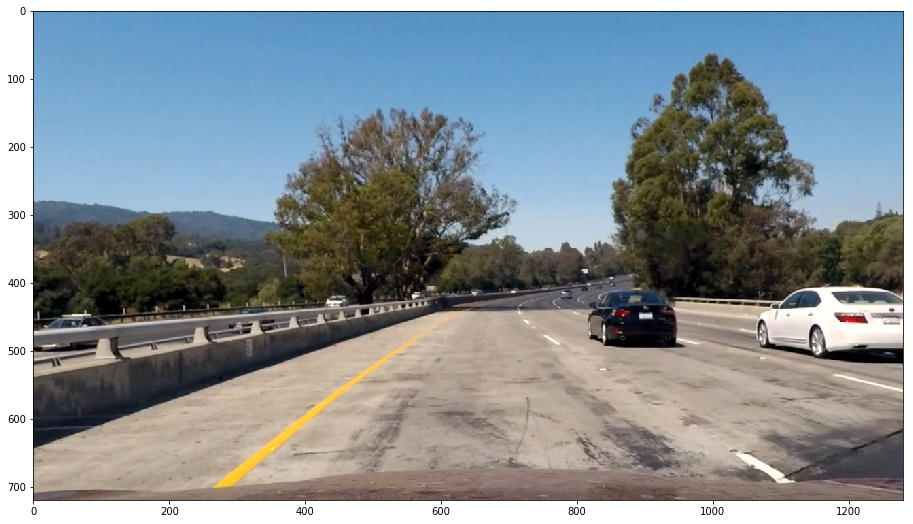

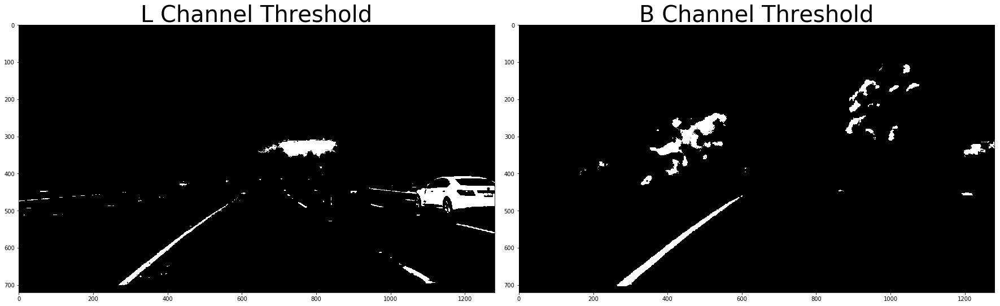

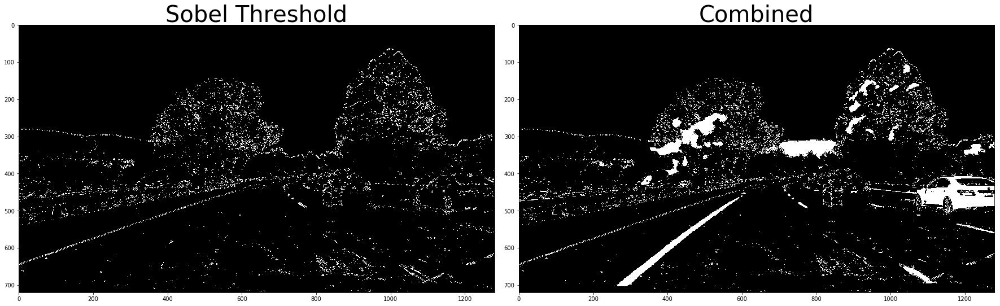

In [25]:
image = undistorted_images[2]
sobel_binary = sobel_thresh(image)
color_binary = color_thresh(image, thresh=(190, 255))
#s_channel_binary = hls_thresh(image, thresh=(90, 255))
s_channel_binary = hsv_thresh(image, thresh=(160,255))
l_channel_binary = luv_thresh(image, thresh=(210,255))
b_channel_binary = lab_thresh(image, thresh=(150,255))
combined = pipeline(image)

plt.figure(figsize=(24,9))
plt.imshow(image)
plt.show()

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(l_channel_binary, cmap='gray')
ax1.set_title('L Channel Threshold', fontsize=40)

ax2.imshow(b_channel_binary, cmap='gray')
ax2.set_title('B Channel Threshold', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(sobel_binary, cmap='gray')
ax1.set_title('Sobel Threshold', fontsize=40)

ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



**Then an image with shadows**

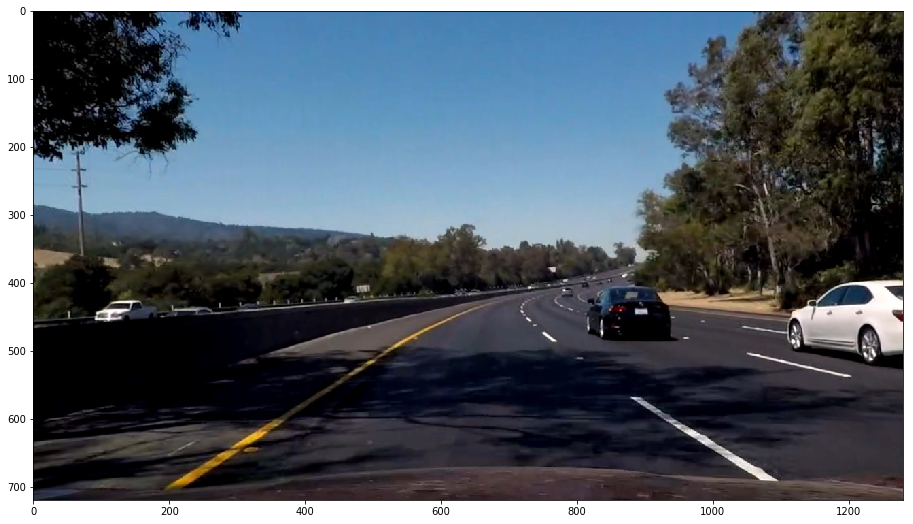

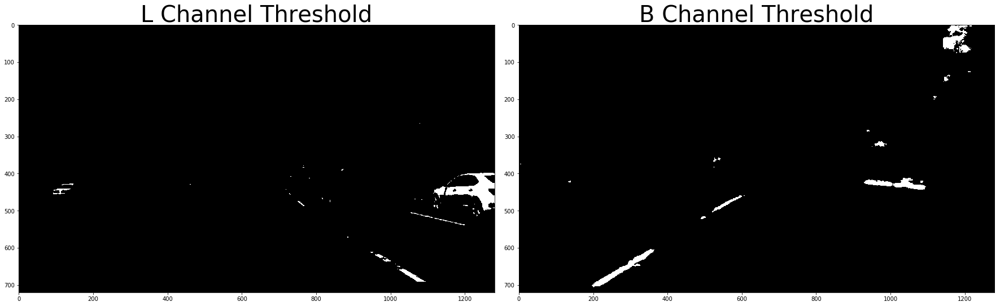

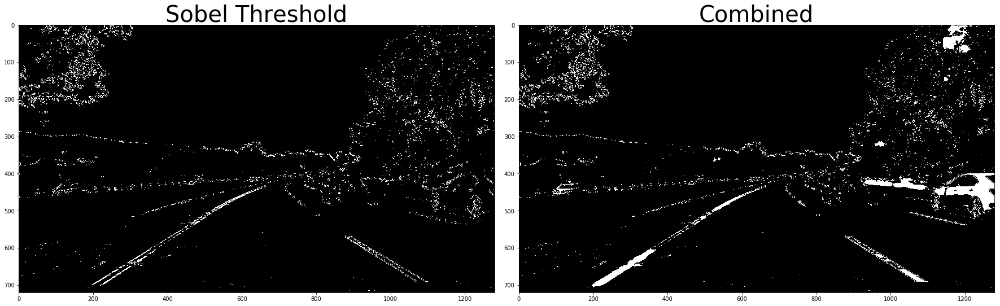

In [26]:

image = undistorted_images[-1]
sobel_binary = sobel_thresh(image)
color_binary = color_thresh(image, thresh=(190, 255))
#s_channel_binary = hls_thresh(image, thresh=(90, 255))
s_channel_binary = hsv_thresh(image, thresh=(160,255))
l_channel_binary = luv_thresh(image, thresh=(210,255))
b_channel_binary = lab_thresh(image, thresh=(150,255))
combined = pipeline(image)

plt.figure(figsize=(24,9))
plt.imshow(image)
plt.show()

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(l_channel_binary, cmap='gray')
ax1.set_title('L Channel Threshold', fontsize=40)

ax2.imshow(b_channel_binary, cmap='gray')
ax2.set_title('B Channel Threshold', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(sobel_binary, cmap='gray')
ax1.set_title('Sobel Threshold', fontsize=40)

ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

**Visualize the pipeline**

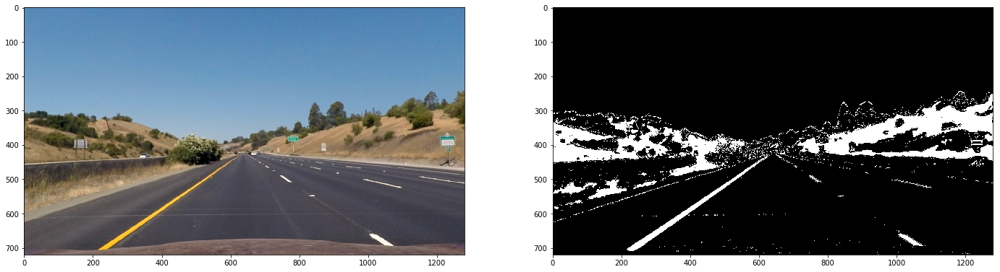

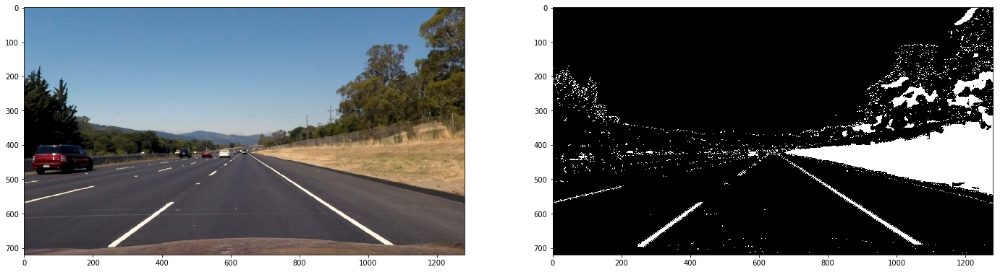

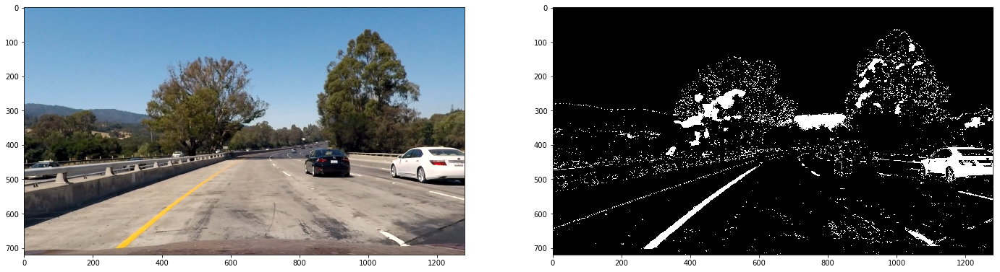

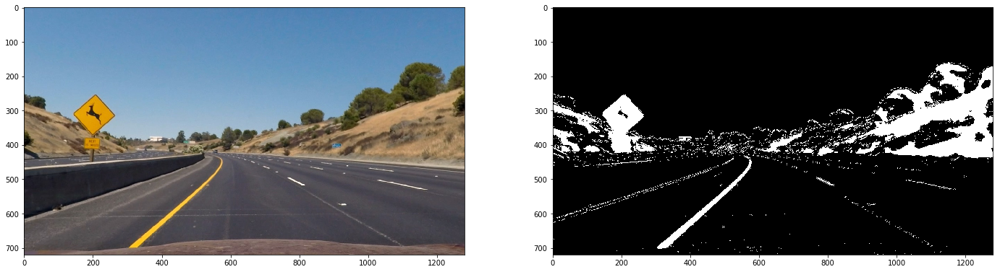

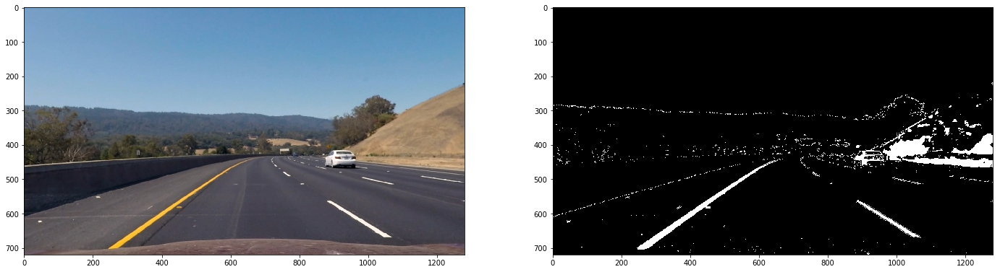

...

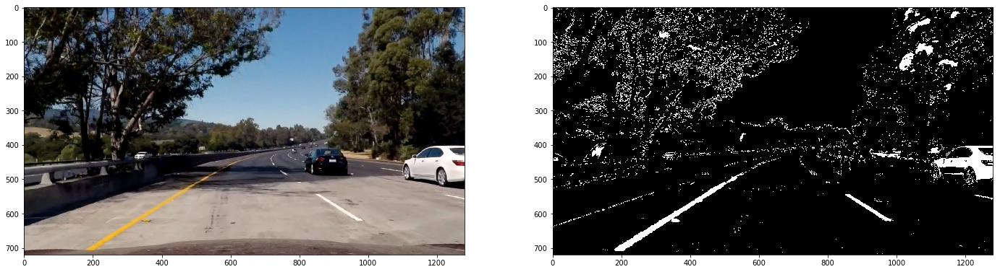

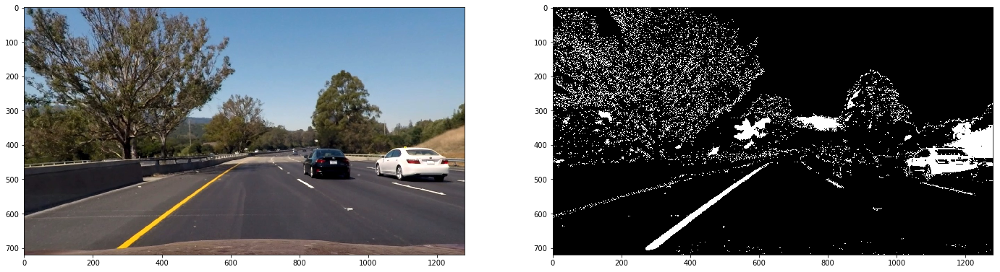

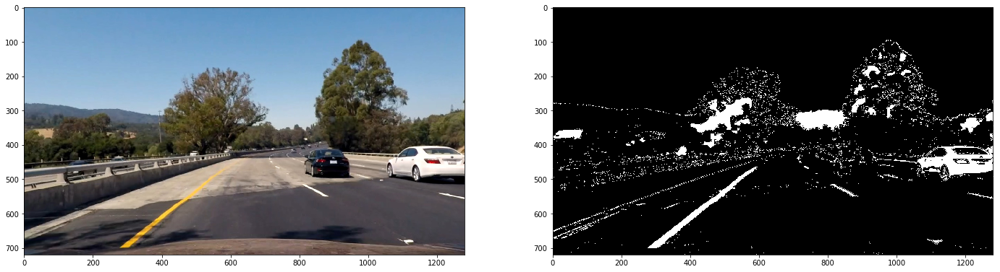

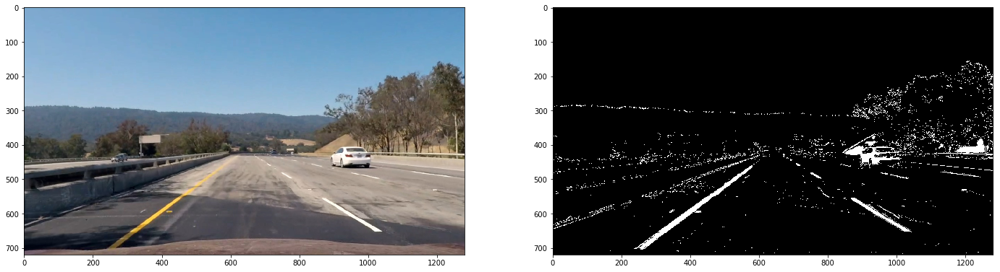

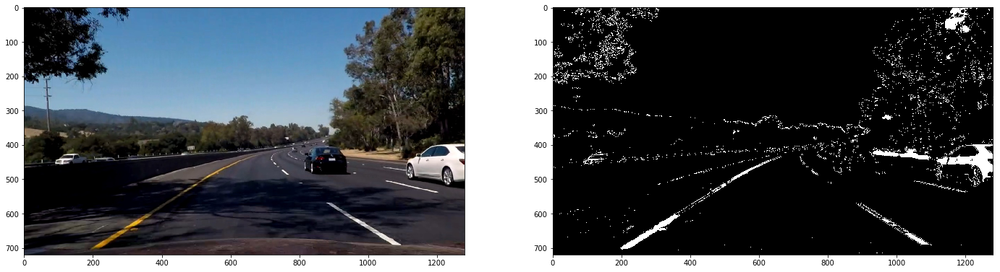

In [11]:
binary_images = []

for image_undistorted in undistorted_images:
    image_binary = pipeline(image_undistorted)
    binary_images.append(image_binary)
    fig = plt.figure(figsize=(24, 9))
    fig.add_subplot(1,2,1)
    plt.imshow(image_undistorted)
    fig.add_subplot(1,2,2)
    plt.imshow(image_binary, cmap='gray')
    plt.show()


# 4. Perspective Transform


In [12]:
def perspectiveTransform(img):
    src = np.float32([[200, 720], [550, 480], [730, 480], [1080, 720]])
    dst = np.float32([[200, 720], [200,0], [1080,0], [1080, 720]])
   
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

def perspectiveRestore(img, Minv):
    img_size = (img.shape[1], img.shape[0])
    restored = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
    return restored

**Visualize perspective transformation**

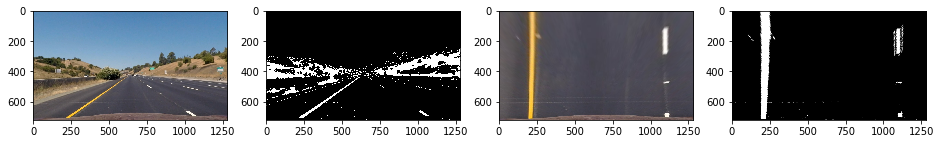

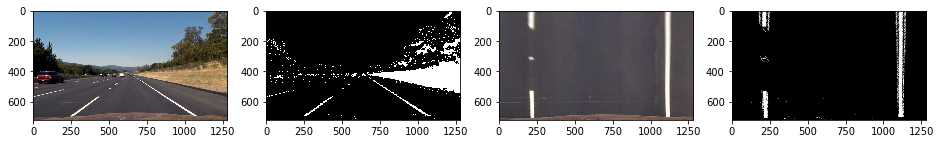

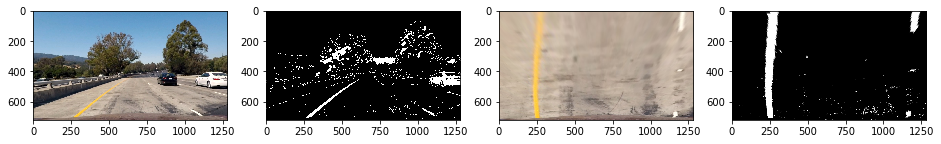

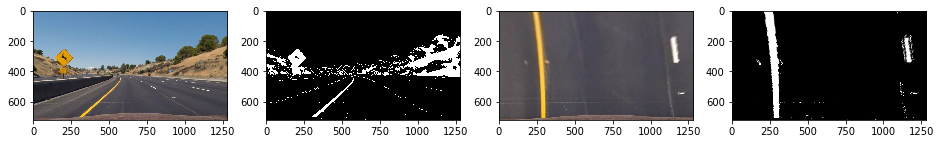

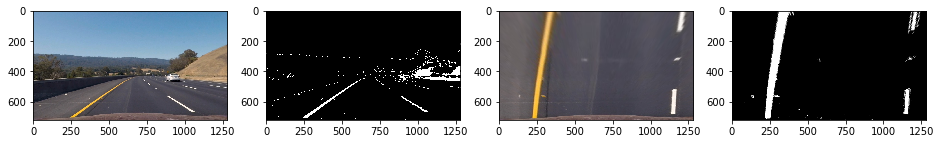

...

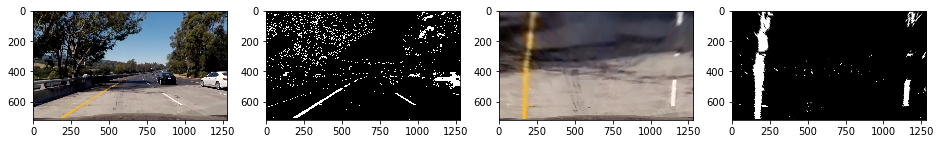

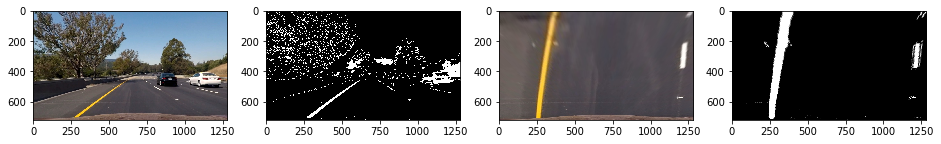

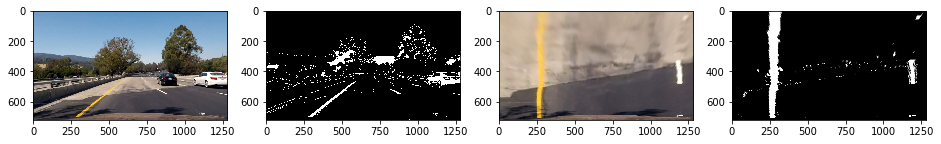

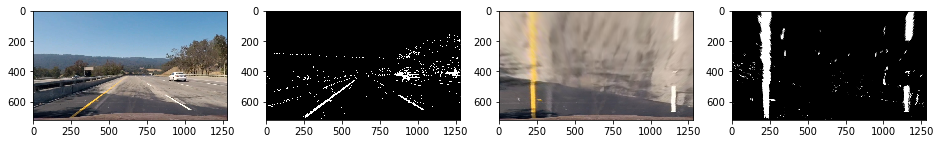

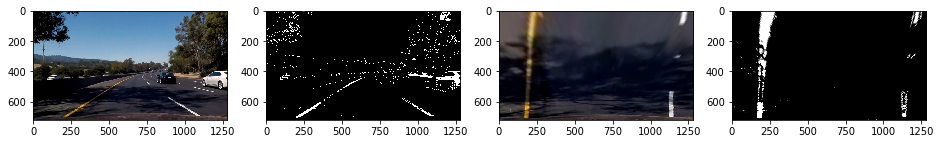

In [13]:
top_downs = []
binary_top_downs = []

for idx, undistorted_image in enumerate(undistorted_images):
    binary_image = binary_images[idx]
    top_down, M, Minv = perspectiveTransform(undistorted_image)
    top_down_binary, M, Minv = perspectiveTransform(binary_image)
    top_downs.append(top_down)
    binary_top_downs.append(top_down_binary)
    fig = plt.figure(figsize=(16, 9))
    fig.add_subplot(1,4,1)
    plt.imshow(undistorted_image)
    fig.add_subplot(1,4,2)
    plt.imshow(binary_image, cmap='gray')
    fig.add_subplot(1,4,3)
    plt.imshow(top_down)
    fig.add_subplot(1,4,4)
    plt.imshow(top_down_binary, cmap='gray')
    plt.show()


# 4. Detect lane lines

In [14]:
# start searching for the lane lines from scratch
def detect_lane_lines_cold(binary_warped):

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Create an output image to draw on and  visualize the result
#     out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
#         cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
#         cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = [0,0,0]
    right_fit = [0,0,0]
    if (len(lefty) > 0 and len(leftx) > 0):
        left_fit = np.polyfit(lefty, leftx, 2)
    if (len(rightx) > 0 and len(righty) > 0):
        right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

In [15]:
# search for the lane lines given previous positions of the lane lines
def detect_lane_lines_hot(binary_warped, prev_left_fit, prev_right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (prev_left_fit[0]*(nonzeroy**2) + prev_left_fit[1]*nonzeroy + prev_left_fit[2] - margin)) & (nonzerox < (prev_left_fit[0]*(nonzeroy**2) + prev_left_fit[1]*nonzeroy + prev_left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (prev_right_fit[0]*(nonzeroy**2) + prev_right_fit[1]*nonzeroy + prev_right_fit[2] - margin)) & (nonzerox < (prev_right_fit[0]*(nonzeroy**2) + prev_right_fit[1]*nonzeroy + prev_right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

**Visualization**

In [16]:
def draw_lane_fit_lines(top_down, binary_warped):
    fig = plt.figure(figsize=(16, 9))
    fig.add_subplot(1,2,1)
    plt.imshow(top_down)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds = detect_lane_lines_cold(binary_warped)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Create an output image to draw on and  visualize the result
    out_img = np.zeros([binary_warped.shape[0], binary_warped.shape[1], 3], dtype=np.uint8)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    fig.add_subplot(1,2,2)
    plt.imshow(out_img)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

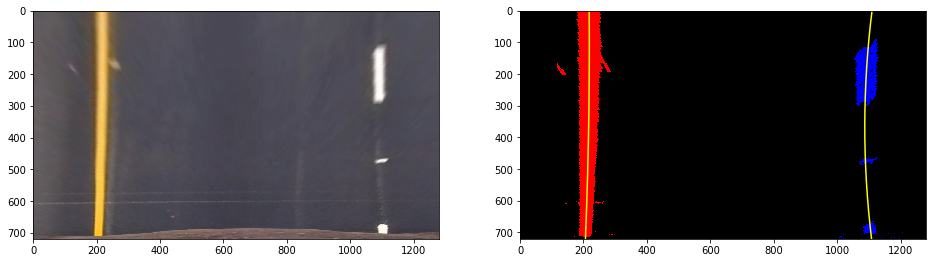

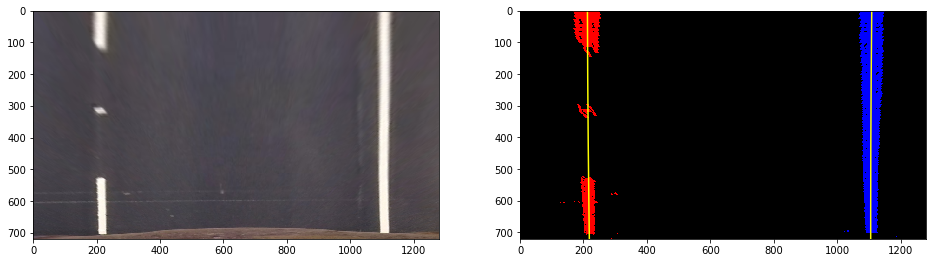

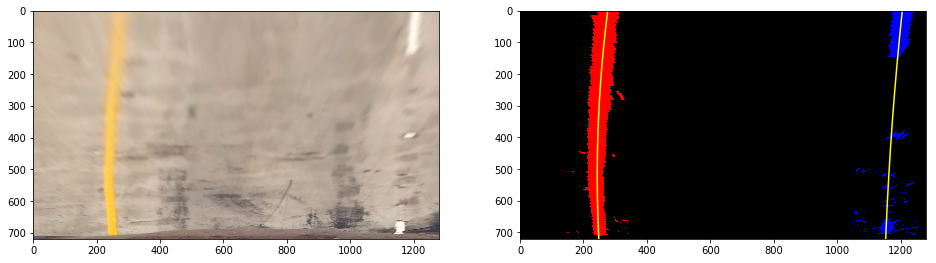

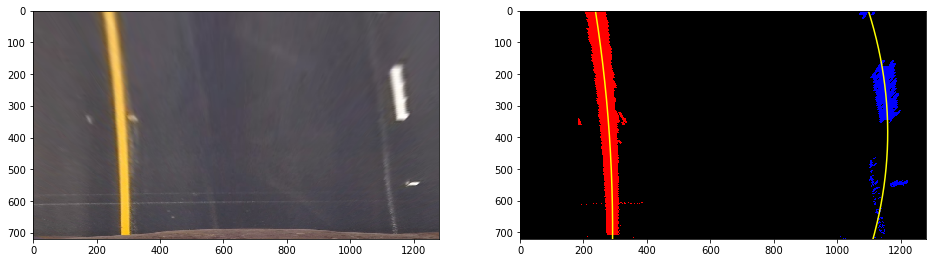

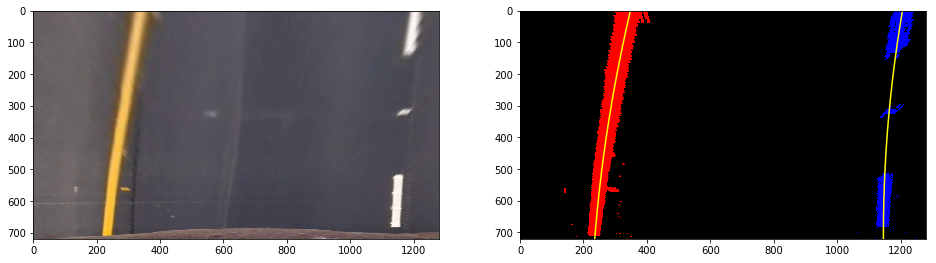

...

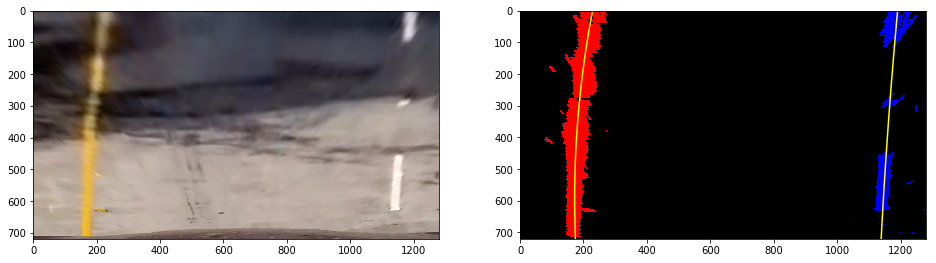

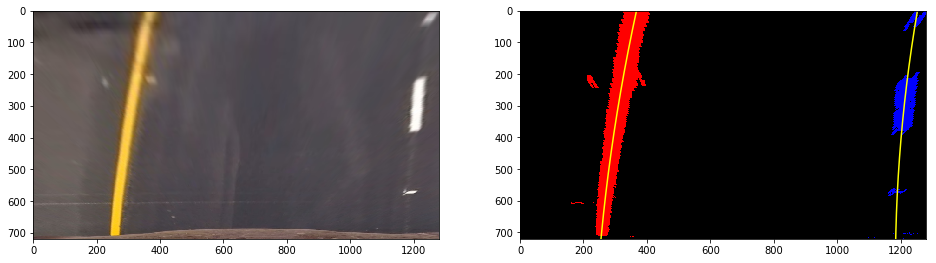

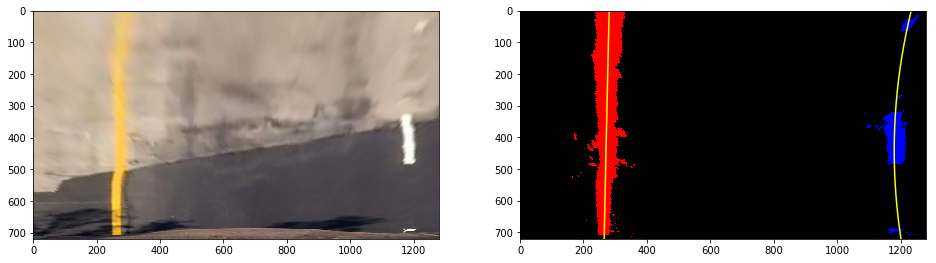

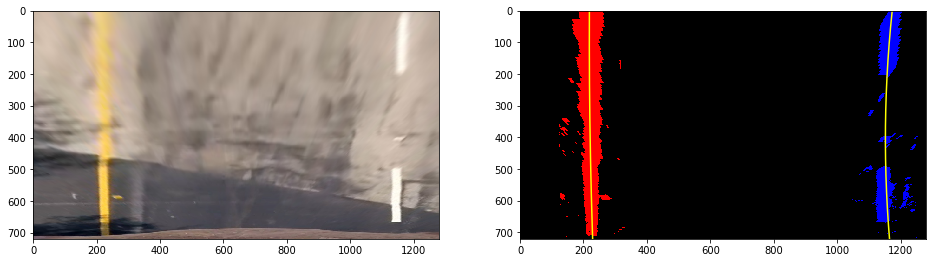

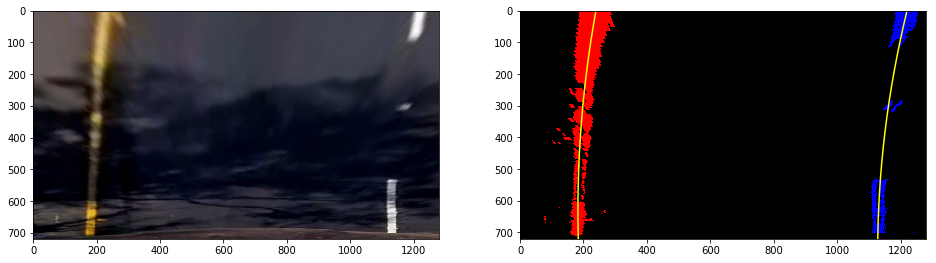

In [17]:
for idx, binary_top_down in enumerate(binary_top_downs):
    top_down = top_downs[idx]
    top_down_binary_fit = draw_lane_fit_lines(top_down, binary_top_down)


# 5. Measure Curvature

In [18]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def calc_curvature(binary_warped, x, y):
    
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
    
    y_eval = binary_warped.shape[0]
    curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    curverad = np.round(curverad, 2)
    return curverad


**Define a Line class to store the history data**

In [19]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        self.image = None
        self.M = None
        self.Minv = None
        
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted_left = [] 
        self.recent_xfitted_right = []
        
        #average x values of the fitted line over the last n iterations
        self.bestx_left = None  
        self.besty_right = None
        #polynomial coefficients averaged over the last n iterations
        self.best_fit_left = None  
        self.best_fit_right = None  
        
        #polynomial coefficients for the most recent fit
        self.current_fit_left = [np.array([False])] 
        self.current_fit_right = [np.array([False])] 
        
        #radius of curvature of the line in some units
        self.radius_of_curvature_left = None 
        self.radius_of_curvature_right = None 
        self.radius_of_curvature_mid = None
        
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx_left = None  
        self.allx_right = None
        self.allx_mid = None
        #y values for detected line pixels
        self.ally_left = None
        self.ally_right = None
        self.ally_mid = None
    
        # vehicle's offset from the center of image
        self.offset = None
        
    def sanity_check(self, left_fit, right_fit):
        # Generate x and y values for plotting
        ploty = np.linspace(0, self.image.shape[0]-1, self.image.shape[0] )
        leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        midx = (leftx + rightx)/2
        
        mid_fit = np.polyfit(ploty, midx, 2)
        
        #1 check the left right curvature have the same sign, i.e. curving toward the same direction
        left_curv = calc_curvature(self.image, leftx, ploty)
        right_curv = calc_curvature(self.image, rightx, ploty)
        mid_curv = calc_curvature(self.image, midx, ploty)
        
        if ((left_curv > 0 and right_curv < 0) or (left_curv < 0 and right_curv > 0)):
            return False
        
        # check that they are not an order of magnitude different
        ratio = np.absolute(left_curv/right_curv)
        if (ratio > 10 or ratio < 0.1 ):
            return False
        
        #2 check that the distance between left and right lane is roughly the correct distance ~900 px
        distance = 900
        variance = 100
        if (np.absolute((rightx[-1] - leftx[-1]) - distance) > variance):
            return False
        
        #3 check that lines are roughly parallel, measured by standard deviation
        dist = rightx - leftx
        std = np.std(dist)
        if (std > 100):
            return False
        
        # Sanity check passed, update all the values
        self.ally_left = self.ally_right = self.ally_mid = ploty
        self.allx_left = leftx
        self.allx_right = rightx
        self.allx_mid = midx
        
        self.radius_of_curvature_left = left_curv
        self.radius_of_curvature_right = right_curv
        self.radius_of_curvature_mid = mid_curv

        lane_center = (leftx[-1] + rightx[-1]) / 2
        image_center = self.image.shape[1] / 2
        self.offset = np.absolute(lane_center - image_center) * xm_per_pix
        self.offset = np.round(self.offset, 2)
        
        return True
        
    def find_lane_lines(self, binary_warped, M, Minv):
        self.image = binary_warped
        self.M = M
        self.Minv = Minv
        
        if (self.detected):
            left_fit_prev = self.current_fit_left[-1]
            right_fit_prev = self.current_fit_right[-1]
            left_fit, right_fit, left_lane_inds, right_lane_inds = detect_lane_lines_hot(binary_warped, left_fit_prev, right_fit_prev)
        else:
            left_fit, right_fit, left_lane_inds, right_lane_inds = detect_lane_lines_cold(binary_warped)
        
        if (self.sanity_check(left_fit, right_fit)):
            # pass
            self.detected = True
        else:
            # not pass
            self.detected = False
            # use the last one as current fit
            left_fit = self.current_fit_left[-1]
            right_fit = self.current_fit_right[-1]
            
        self.current_fit_left.append(left_fit)
        self.current_fit_right.append(right_fit)
        
        # only keep the last 10 set of coefficiencies
        if (len(self.current_fit_left) > 10):
            self.current_fit_left = self.current_fit_left[-10:]
        if (len(self.current_fit_right) > 10):
            self.current_fit_right = self.current_fit_right[-10:]
        
        # get the average of the previous 10 coefficiencies
        self.best_fit_left = np.mean(self.current_fit_left, axis=0)
        self.best_fit_right = np.mean(self.current_fit_right, axis=0)
        
        return self.best_fit_left, self.best_fit_right
    
    def get_curvature():
        return self.radius_of_curvature_left, self.radius_of_curvature_right, self.radius_of_curvature_mid
    
    def draw_lane_region(self):
        # Create an blank image
        warp_zero = np.zeros_like(self.image).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Generate a polygon to mark the region between the left lane and right lane
        left_line_pts = np.array([np.transpose(np.vstack([self.allx_left, self.ally_left]))])
        right_line_pts = np.array([np.flipud(np.transpose(np.vstack([self.allx_right, self.ally_right])))])
        lane_region_pts = np.hstack((left_line_pts, right_line_pts))

        # Draw the lane region onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([lane_region_pts]), (0,255, 0))

        # Perspective transform back to 3D
        perspective_restored = perspectiveRestore(color_warp, self.Minv)
        return perspective_restored
    
    def annotate_image(self, image):
        curv_str = 'curvature: ' + str(self.radius_of_curvature_mid) + 'm'
        offset_str = 'offset: ' + str(self.offset) + 'm'

        font = cv2.FONT_HERSHEY_COMPLEX
        scale = 1
        white = (255, 255, 255)
        thickness = 2
        cv2.putText(image, curv_str, (30, 120), font, scale, white, thickness)
        cv2.putText(image, offset_str, (30, 150), font, scale, white, thickness)
        
        return image

# 6. Complete pipeline

In [20]:
line = Line()

def process_image(image):
    undistorted = undistort(image)
    binary = pipeline(undistorted)
    top_down, M, Minv = perspectiveTransform(binary)
    left_fit, right_fit = line.find_lane_lines(top_down, M, Minv)
    lane_image = line.draw_lane_region()
    result = cv2.addWeighted(undistorted, 1, lane_image, 0.3, 0)
    line.annotate_image(result)
    return result

# 7. Test on video

In [21]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output_file1 = 'output_videos/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(38,48)
clip1 = VideoFileClip("project_video.mp4")
write_clip1 = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time write_clip1.write_videofile(output_file1, audio=False)

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████▉| 1260/1261 [06:14<00:00,  3.46it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 

CPU times: user 7min 4s, sys: 1min 42s, total: 8min 47s
Wall time: 6min 15s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_file1))

In [23]:
output_file2 = 'output_videos/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip2 = VideoFileClip("challenge_video.mp4")
write_clip2 = clip2.fl_image(process_image) #NOTE: this function expects color images!!
%time write_clip2.write_videofile(output_file2, audio=False)

[MoviePy] >>>> Building video output_videos/challenge_video.mp4
[MoviePy] Writing video output_videos/challenge_video.mp4


100%|██████████| 485/485 [02:27<00:00,  3.42it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video.mp4 

CPU times: user 2min 47s, sys: 39.7 s, total: 3min 27s
Wall time: 2min 28s


In [24]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_file2))